In [2]:
import openslide
import numpy as np
import mahotas as mh
import matplotlib
%matplotlib inline  

In [4]:
def show(pix):
    fig, ax = plt.subplots(figsize=(12, 12))
    ax.imshow(pix, interpolation='nearest', aspect='equal')

In [160]:
slide = openslide.OpenSlide('data/70229.svs')
# file is in RGBA color format

In [4]:
for key in slide.properties.keys():
    print key, ':' , slide.properties[key]

aperio.AppMag : 20
aperio.DSR ID : 10.6.20.46
aperio.Date : 05/31/12
aperio.DisplayColor : 0
aperio.Exposure Scale : 0.000001
aperio.Exposure Time : 109
aperio.Filename : 70229
aperio.Focus Offset : 0.000000
aperio.ICC Profile : ScanScope v1
aperio.ImageID : 70229
aperio.Left : 19.082787
aperio.LineAreaXOffset : 0.000000
aperio.LineAreaYOffset : 0.000000
aperio.LineCameraSkew : -0.000400
aperio.MPP : 0.5040
aperio.OriginalHeight : 39691
aperio.OriginalWidth : 53000
aperio.ScanScope ID : SS1318
aperio.StripeWidth : 1000
aperio.Time : 14:42:01
aperio.Top : 23.151741
aperio.User : 8071000d-24ef-4dfd-b5e4-15b3a5a244b2
openslide.comment : Aperio Image Library v10.2.41
53000x39691 [0,100 50896x39591] (256x256) JPEG/RGB Q=70|AppMag = 20|StripeWidth = 1000|ScanScope ID = SS1318|Filename = 70229|Date = 05/31/12|Time = 14:42:01|User = 8071000d-24ef-4dfd-b5e4-15b3a5a244b2|MPP = 0.5040|Left = 19.082787|Top = 23.151741|LineCameraSkew = -0.000400|LineAreaXOffset = 0.000000|LineAreaYOffset = 0.000000

In [5]:
slide.properties['aperio.OriginalWidth']

u'53000'

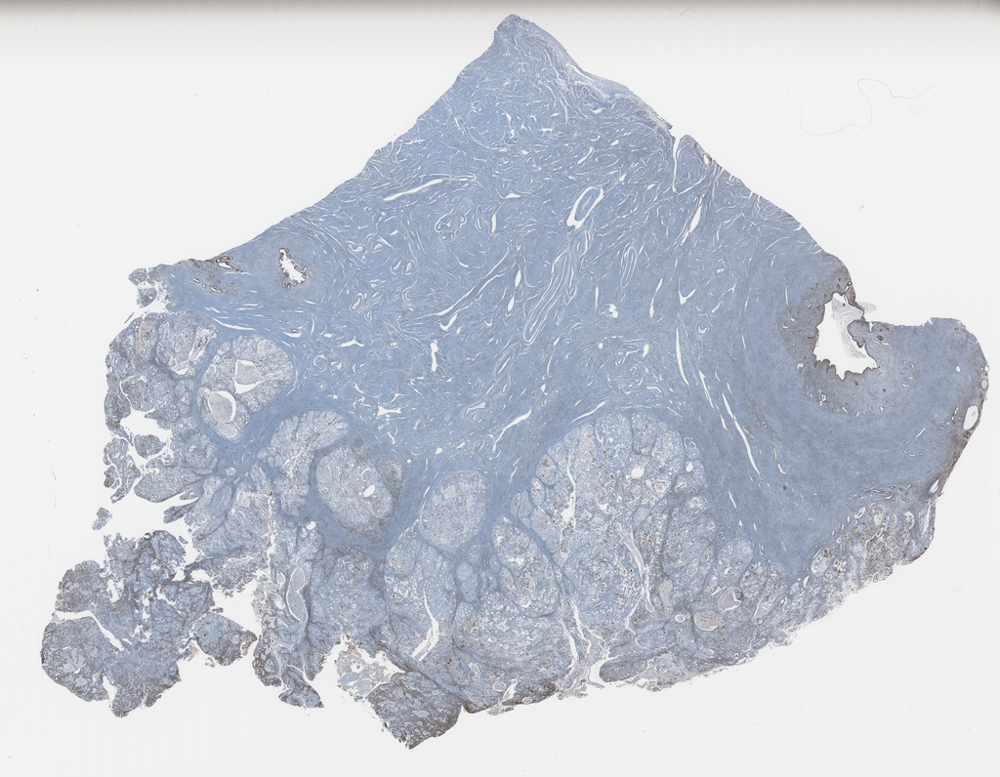

In [6]:
slide.get_thumbnail((1024,1024))

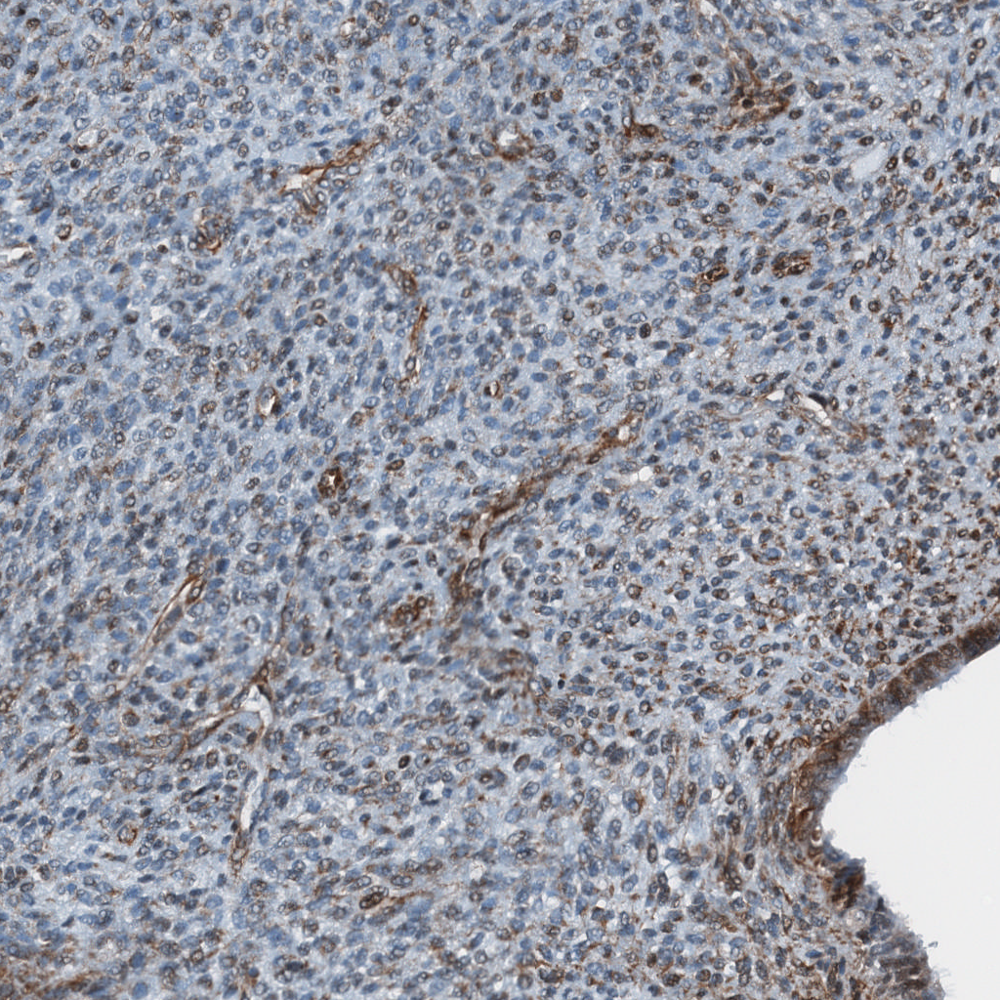

In [7]:
# read_region takes location (upper left pixel), level, and size
width = int(slide.properties['openslide.level[0].width'])
height = int(slide.properties['openslide.level[0].height'])
slide.read_region((4*(width/5),2*(height/5)),0,(1024,1024))

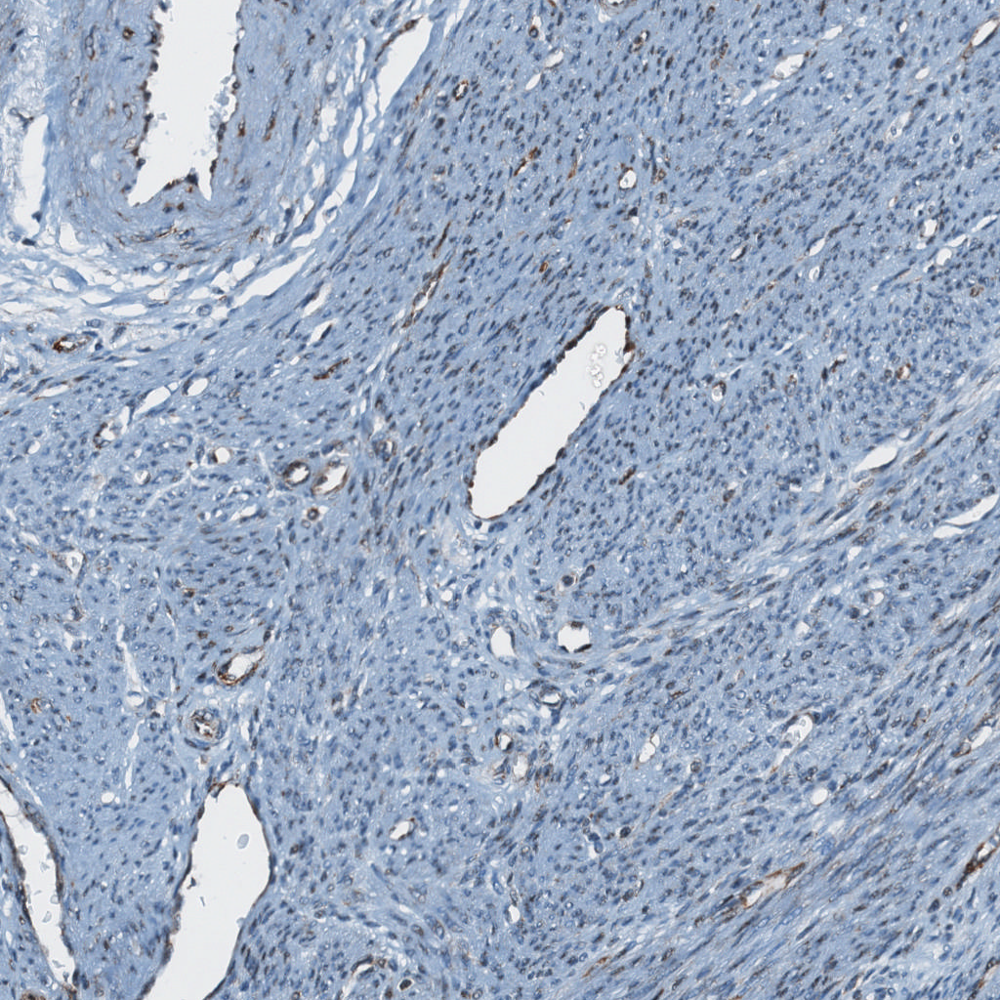

In [8]:
# read_region takes location (upper left pixel), level, and size
width = int(slide.properties['openslide.level[0].width'])
height = int(slide.properties['openslide.level[0].height'])
slide.read_region((width/2,height/2),0,(1024,1024))

In [19]:
def hexencode(rgb):
    r=rgb[0]
    g=rgb[1]
    b=rgb[2]
    return '#%02x%02x%02x' % (r,g,b)

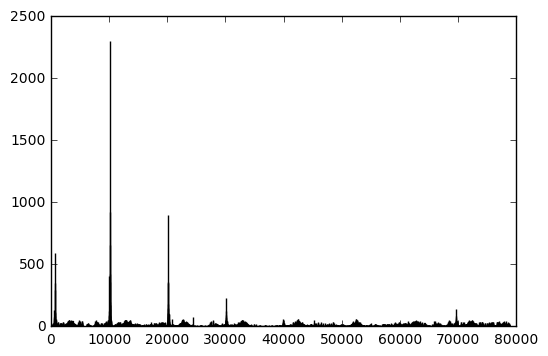

In [20]:
w, h = img.size  
colors = img.getcolors(w*h)

for idx, c in enumerate(colors):
    plt.bar(idx, c[0], color=hexencode(c[1]))

## Load all of the slides

50896 x 39591 : 2015.023536
51857 x 38210 : 1981.45597
10563 x 9849 : 104.034987
9603 x 10725 : 102.992175
14404 x 15008 : 216.175232
24968 x 20434 : 510.196112
12484 x 14376 : 179.469984
8642 x 12734 : 110.047228
13444 x 11490 : 154.47156


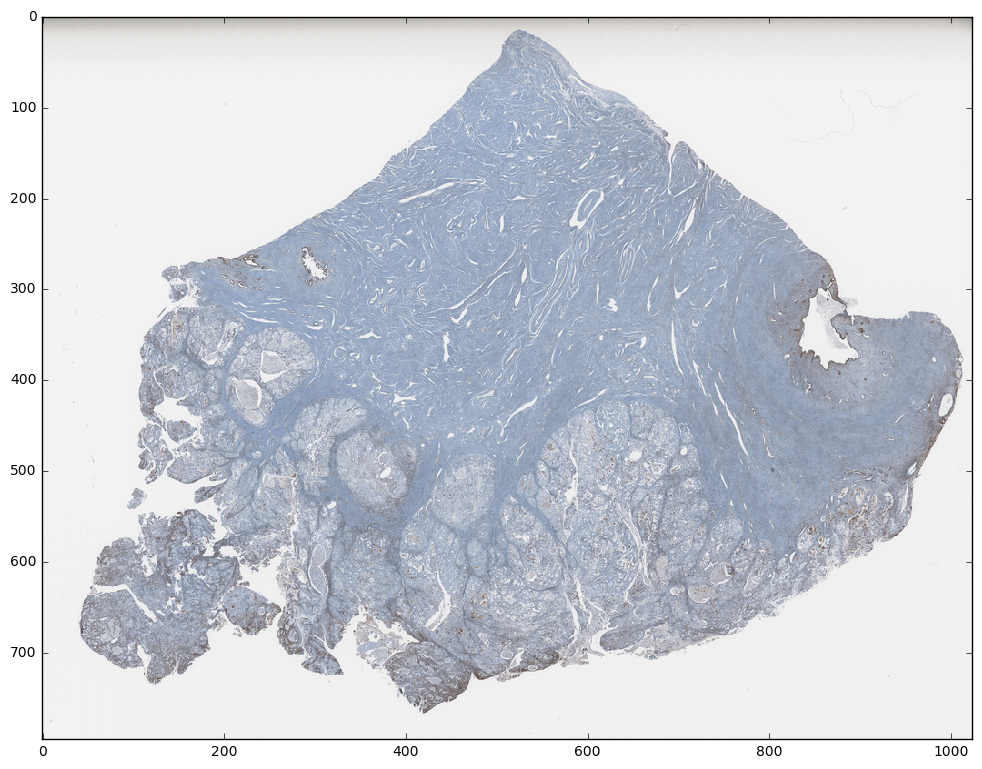

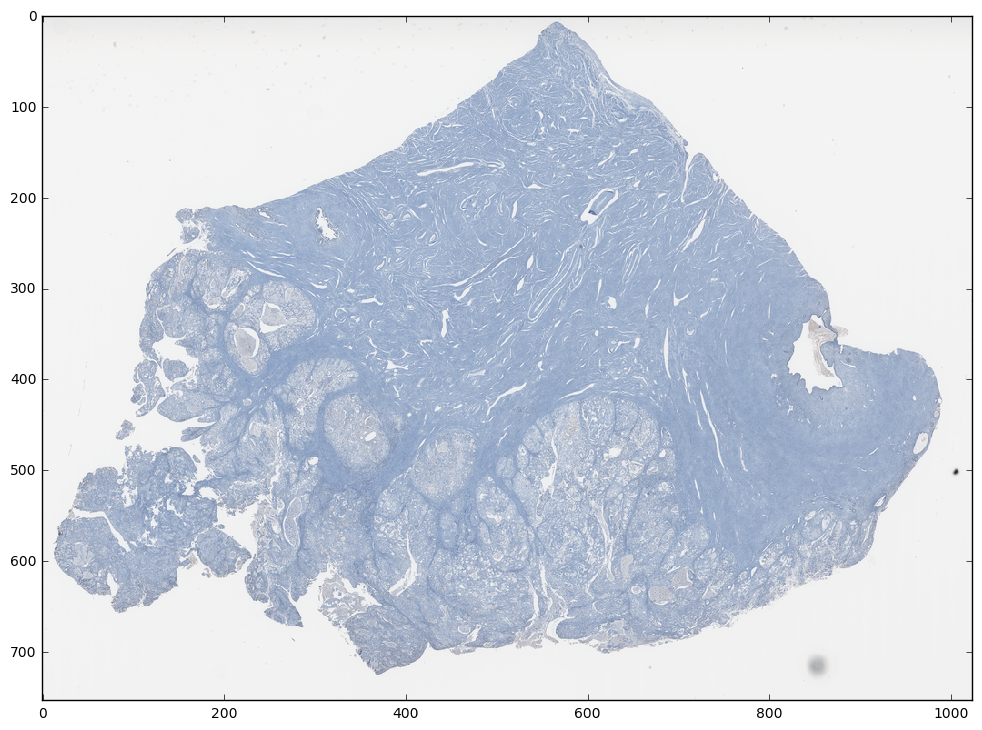

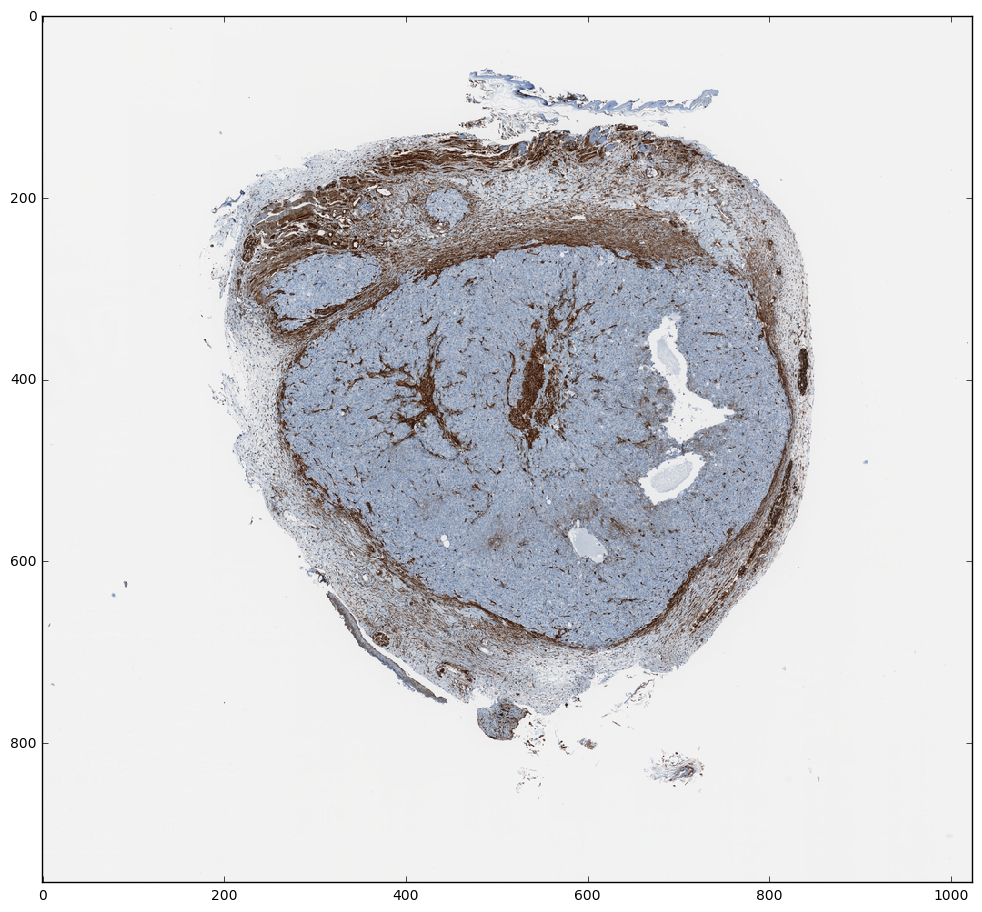

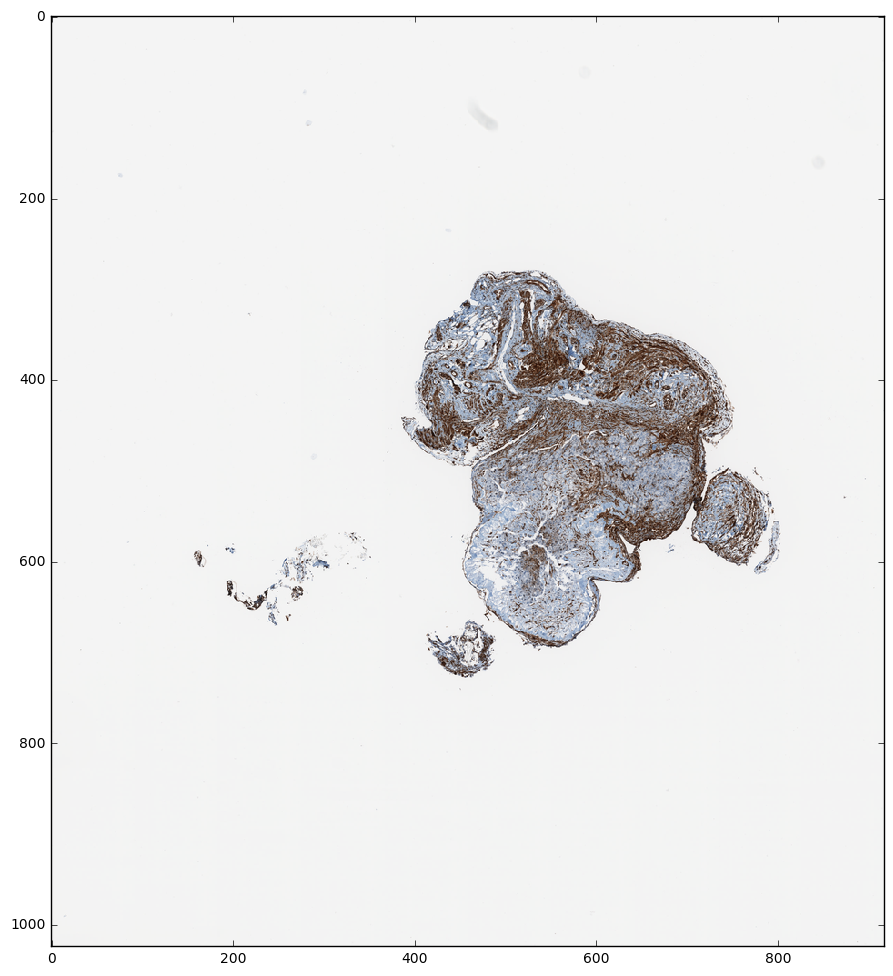

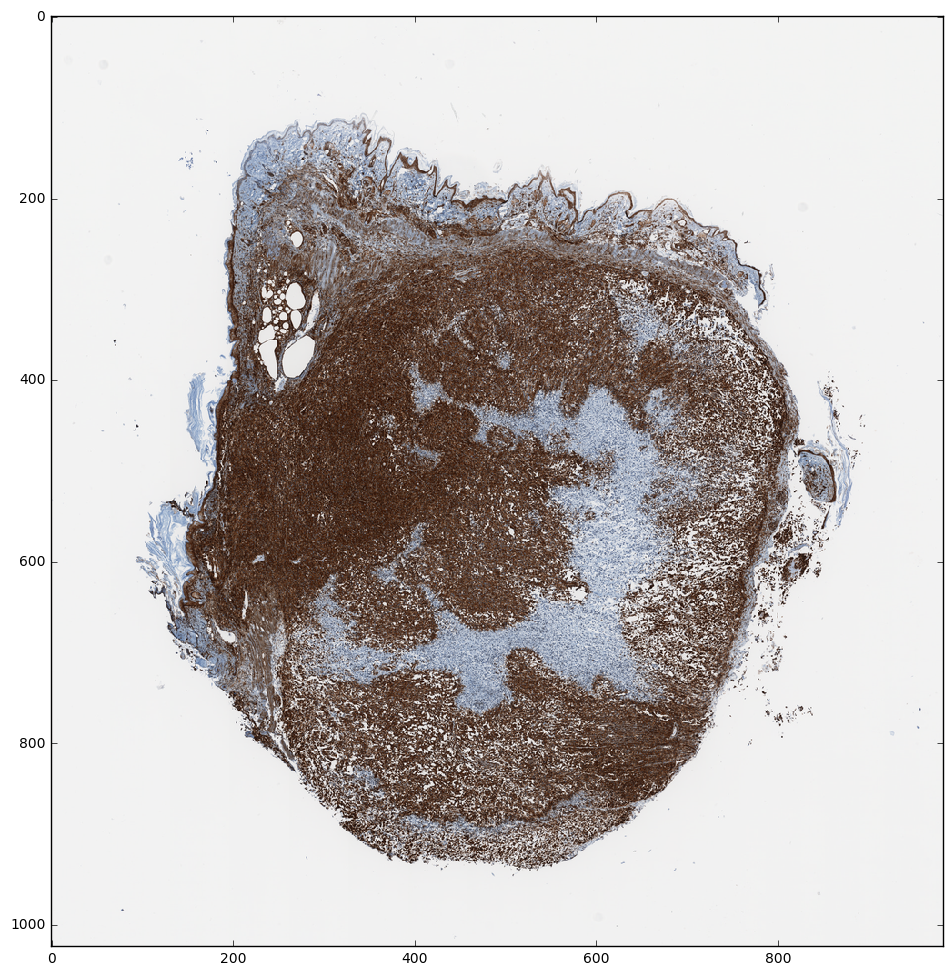

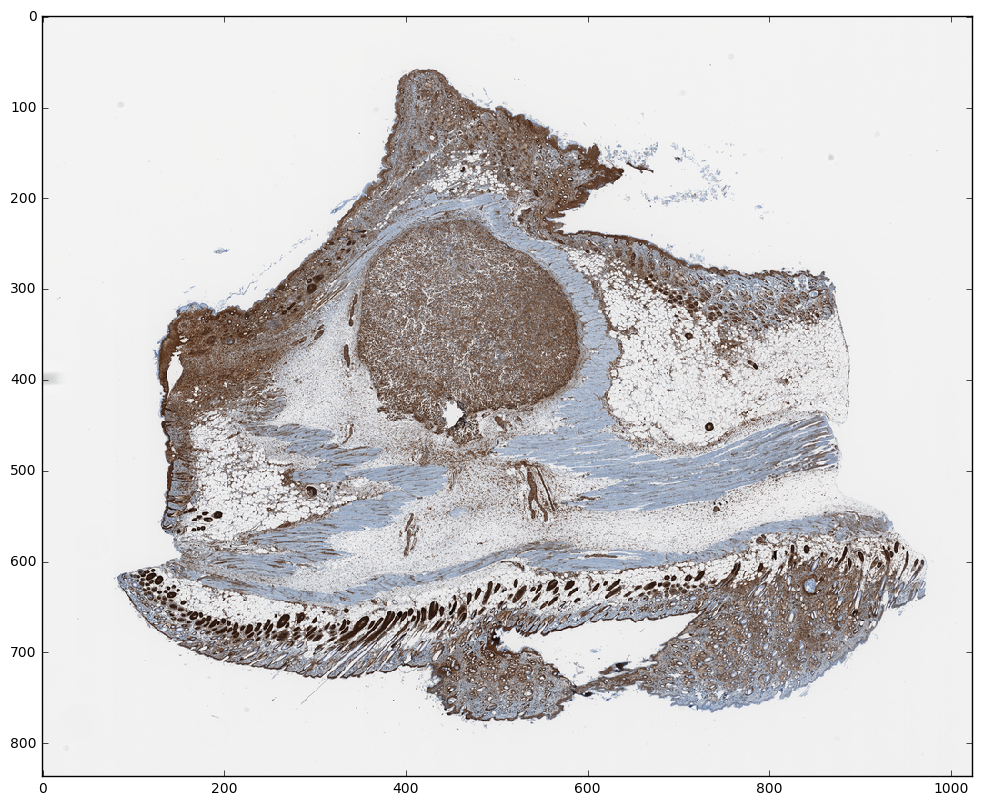

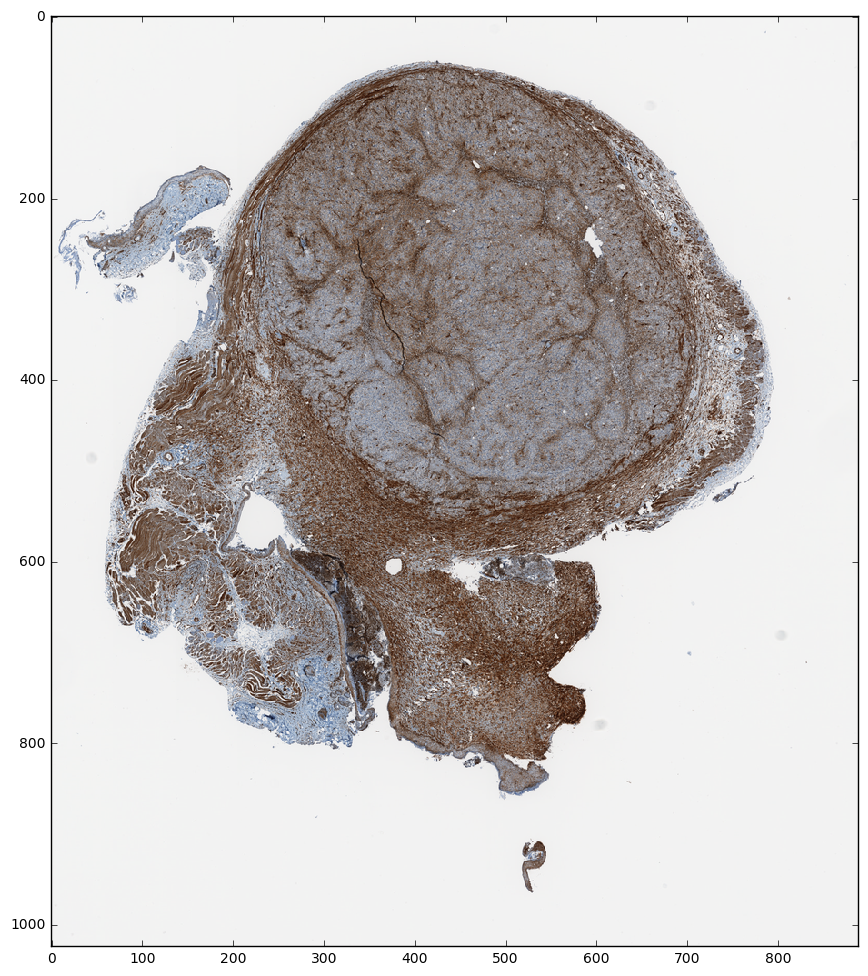

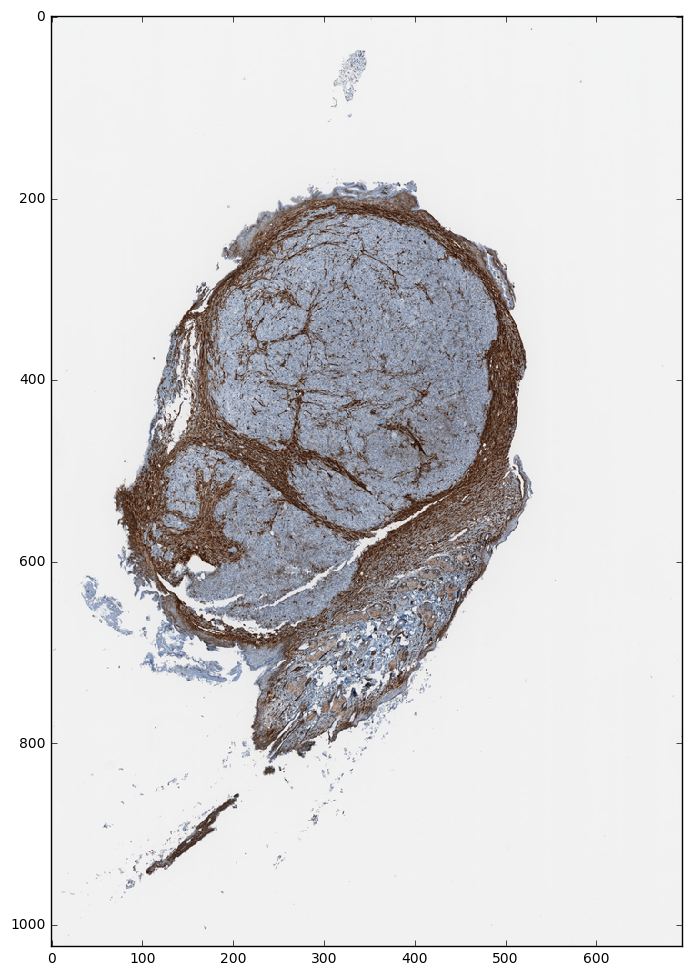

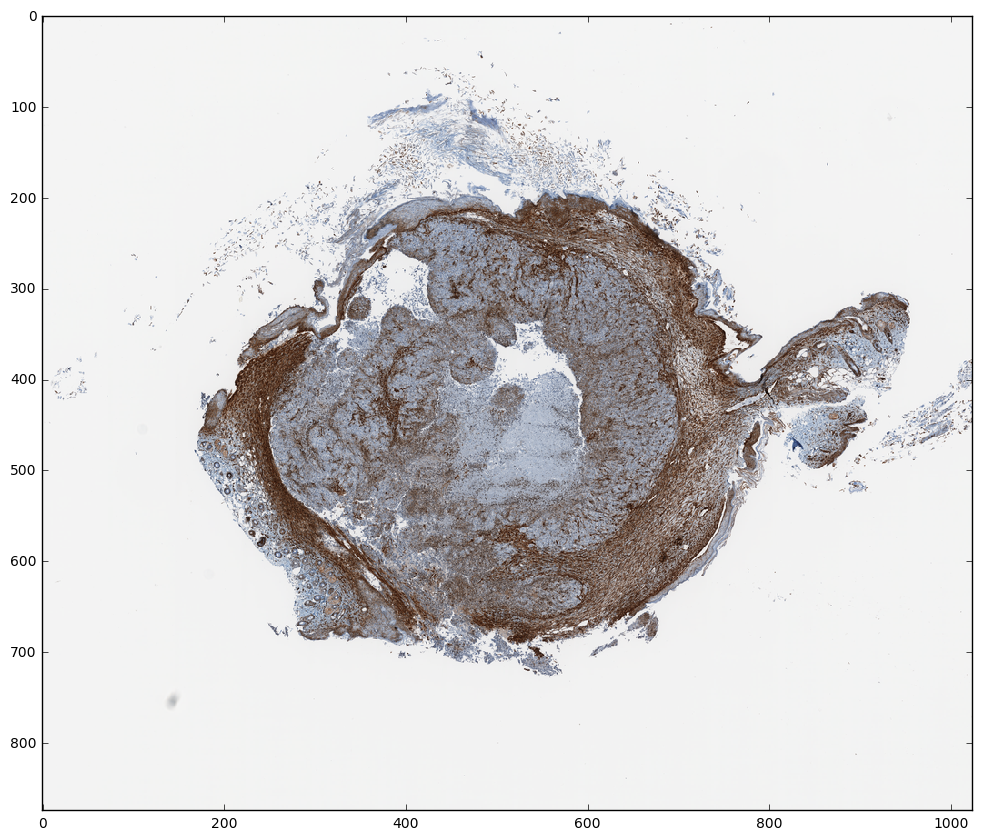

In [5]:
slides = []
slides.append(openslide.OpenSlide('data/70229.svs'))
slides.append(openslide.OpenSlide('data/70230.svs'))
slides.append(openslide.OpenSlide('data/70231.svs'))
slides.append(openslide.OpenSlide('data/70232.svs'))
slides.append(openslide.OpenSlide('data/70233.svs'))
slides.append(openslide.OpenSlide('data/70234.svs'))
slides.append(openslide.OpenSlide('data/70235.svs'))
slides.append(openslide.OpenSlide('data/70236.svs'))
slides.append(openslide.OpenSlide('data/70237.svs'))

for slide in slides:
    width = int(slide.properties['openslide.level[0].width'])
    height = int(slide.properties['openslide.level[0].height'])
    img = slide.get_thumbnail((1024,1024))
    print width,'x',height,':',width*height/1000000.
    show(img)

## Next Steps:

#### 1) Continue working on the nuclei search.  It looks like we can look for distinct rings or ovals.

#### 2) Investigate segmenting the image such that each pixel is associated with the closest nucleus.  For Mark, how much do we care about stain between cells? How close does it have to be to be interesting?

#### 3) We can either mark each tile based on defined regions, or we can perform feature extraction and clustering.  I'm leaning towards a clustering approach since we want to just narrow down the mathematical differences.
